# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 16

**Author 1 (sciper):** Marc El-Khoury 1 (316117)
**Author 2 (sciper):** Sven Norbert Becker 2 (337372)
**Author 3 (sciper):** Nicola Rachel Adele Ramdass 3 (337214)

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [1]:
import tarfile
import os

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

../data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

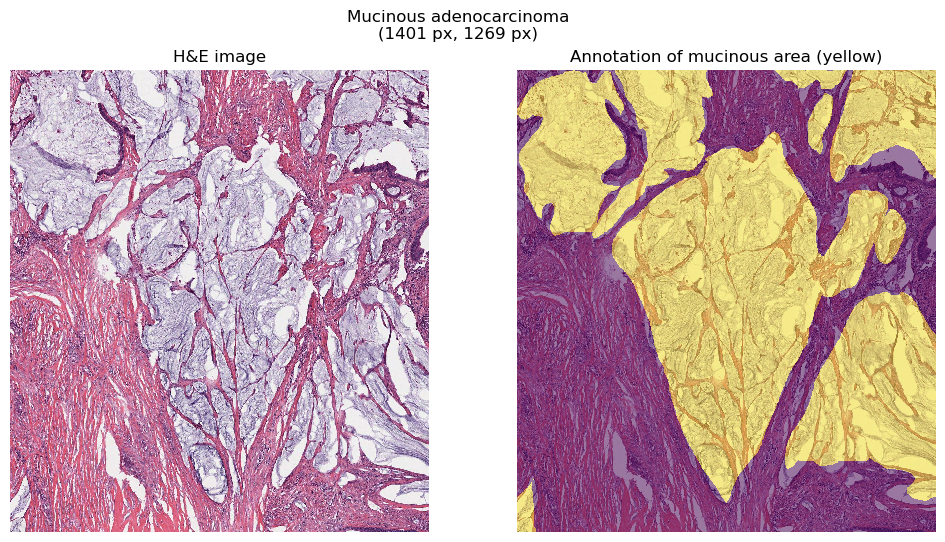

In [2]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

Text(0.5, 1.0, 'Hue channel')

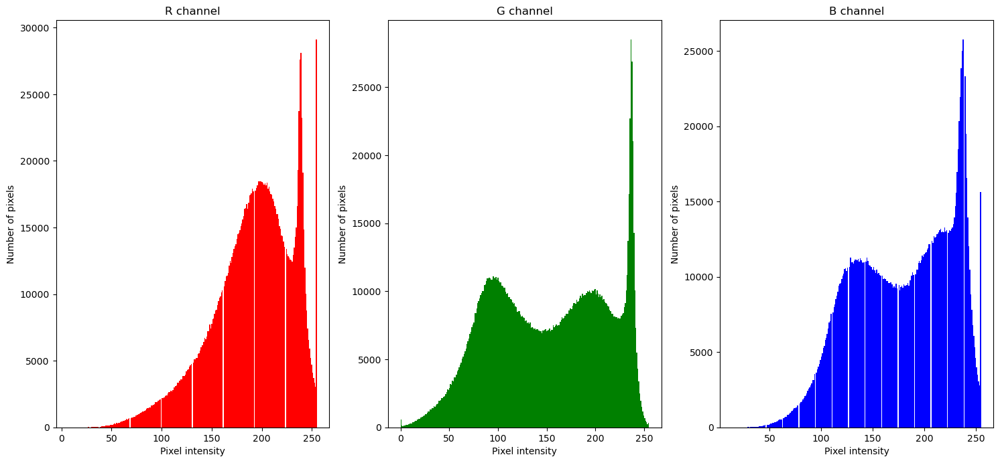

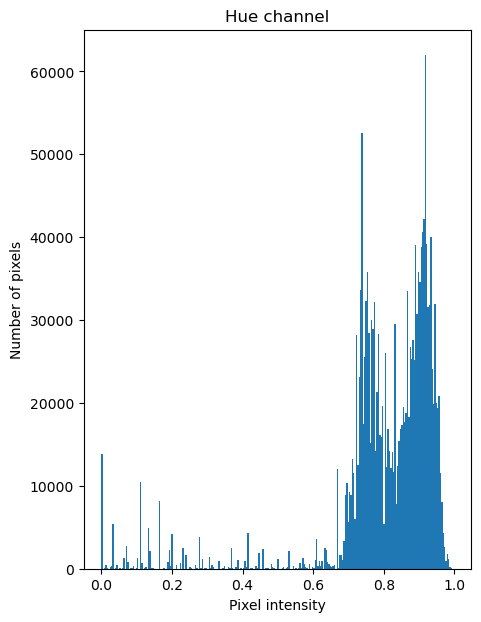

In [3]:
nb_bins = 256
assert adeno_img.dtype==np.uint8
plt.figure(figsize=(15, 7))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.hist(adeno_img[:,:,i].ravel(), bins=nb_bins, color="rgb"[i])
    plt.xlabel('Pixel intensity')
    plt.ylabel('Number of pixels')
    plt.tight_layout(pad=1.0)
    plt.title("{} channel".format("RGB"[i]))
adeno_img_hsv = skimage.color.rgb2hsv(adeno_img)
plt.figure(figsize=(5, 7))
plt.hist(adeno_img_hsv[:,:,0].ravel(), bins=nb_bins)
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.title("Hue channel")

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

* * * * * * * * * * RGB * * * * * * * * * *
Best threshold for channel r is 240 with error 0.4704801084894331
Best threshold for channel g is 150 with error 0.2614821451974245
Best threshold for channel b is 185 with error 0.2735150902569312
* * * * * * * * * * Hue * * * * * * * * * *
Best threshold for channel 'hue' is 0.84 with error 0.19013380625906628


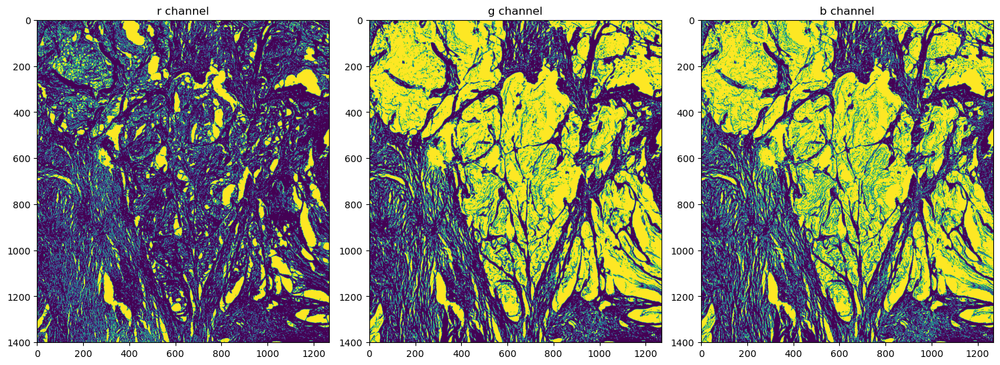

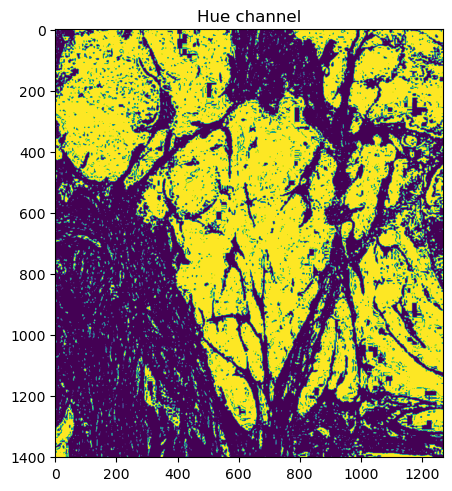

In [4]:
# Define the error function via lambda expression
error_fn = lambda img : 1 - np.sum(np.sum(img == adeno_gt)) / np.prod(adeno_gt.shape[0:2])

# Procedure
# 1. Guess from R, G, B histograms a threshold value and a uncertainty range around it (since we cannot see the best threshold from the histogram with our bare eyes)
# 2. Compute for every channel all thresholds in the uncertainty range and report the errors w.r.t ground truth (use thresholded channel as binary mask)
# 3. Select for each channel the threshold leading to minimal error

print("* " * 10 + "RGB" + " *" * 10)
guesses = {"r": 230, "g":140, "b": 175}
guess_uncertainties = {"r": 10, "g":10, "b": 10}
results = {"r": 0, "g":0, "b": 0}

for channel in guesses.keys():
    errors = np.ones((guess_uncertainties[channel] * 2 + 1,)) * np.inf
    threshs = []
    # Iterate over uncertainty range around guess
    for i, thresh in enumerate(np.arange(-guess_uncertainties[channel], guess_uncertainties[channel] + 1) + guesses[channel]):
        errors[i] = error_fn(adeno_img[:,:,"rgb".index(channel)] > thresh)
        threshs.append(thresh)
    results[channel] = threshs[np.argmin(errors)]
    print("Best threshold for channel {} is {} with error {}".format(channel, thresh, np.min(errors)))

plt.figure(figsize=(15, 7))
for channel, thresh in results.items():
    index = "rgb".index(channel)
    plt.subplot(1,3,index+1)
    plt.imshow(adeno_img[:,:,index]>thresh)
    plt.tight_layout(pad=1.0)
    plt.title("{} channel".format(channel))


# Same procedure as above but simplified (as only 1D)

print("* " * 10 + "Hue" + " *" * 10)

guess = 0.85
guess_uncertainty = 0.1
guess_resolution = 21

guess_range = np.linspace(-guess_uncertainty, guess_uncertainty, guess_resolution) + guess

errors = np.ones(guess_range.shape) * np.inf
threshs = []

for i, thresh in enumerate(guess_range):
    errors[i] = error_fn(adeno_img_hsv[:,:,0] < thresh)
    threshs.append(thresh)
results.update({"hsv": threshs[np.argmin(errors)]})

print("Best threshold for channel 'hue' is {} with error {}".format(results["hsv"], np.min(errors)))

plt.figure(figsize=(5, 7))

plt.imshow(adeno_img_hsv[:,:,0] < results["hsv"])
plt.title("Hue channel")

adeno_img_hsv_thresh = adeno_img_hsv[:,:,0] < results["hsv"]



#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thresholding`

In [5]:
# Since the error is numerically the lowest
mask_thresholding = adeno_img_hsv_thresh

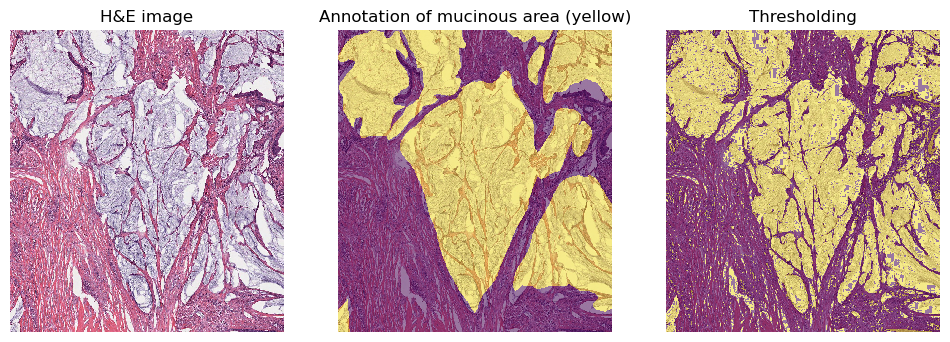

In [6]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(adeno_img, interpolation='nearest')
ax[2].imshow(mask_thresholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thresholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

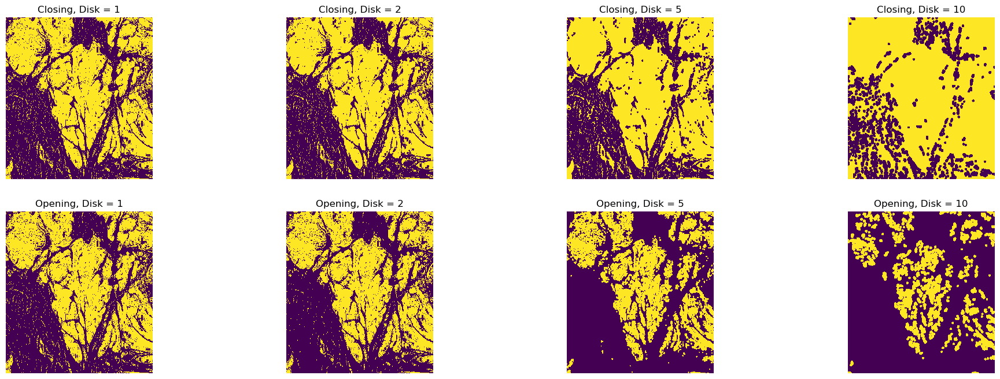

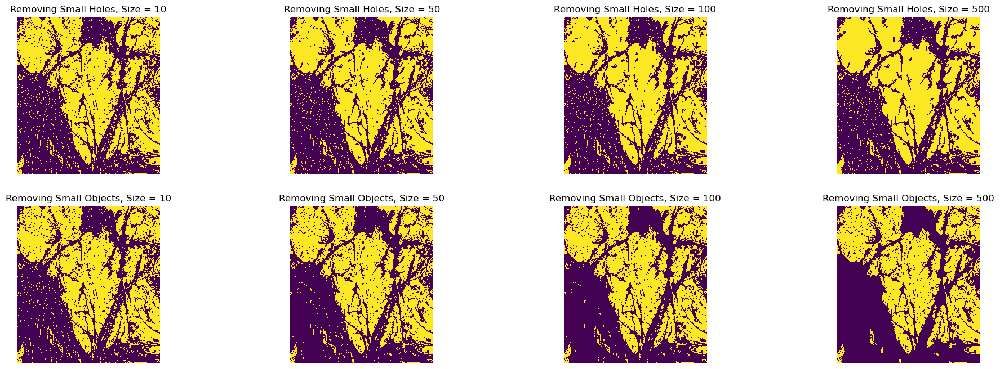

In [7]:
# TODO
import skimage.morphology

# A

radii = [1, 2, 5, 10]
fig, ax = plt.subplots(2, len(radii), figsize=(24, 8))
for i in range(len(radii)):

    # generating disk
    disk_value = skimage.morphology.disk(radii[i])

    # performing opening and closing
    closed = skimage.morphology.closing(mask_thresholding, disk_value)
    opened = skimage.morphology.opening(mask_thresholding, disk_value)

    # plotting
    ax[0,i].imshow(closed, interpolation='nearest')
    ax[0,i].set_title('Closing, Disk = ' + str(radii[i]))
    ax[0,i].axis('off')

    ax[1,i].imshow(opened, interpolation='nearest')
    ax[1,i].set_title('Opening, Disk = ' + str(radii[i]))
    ax[1,i].axis('off')

plt.show()

# B

sizes = [10, 50, 100, 500]
fig, ax = plt.subplots(2, len(sizes), figsize=(24, 8))
for i in range(len(sizes)):

    # performing remove_small_holes and remove_small_objects functions
    # must be type bool
    removed_holes = skimage.morphology.remove_small_holes(mask_thresholding.astype(bool), sizes[i])
    removed_objects = skimage.morphology.remove_small_objects(mask_thresholding.astype(bool), sizes[i])

    # plotting
    ax[0,i].imshow(removed_holes, interpolation='nearest')
    ax[0,i].set_title('Removing Small Holes, Size = ' + str(sizes[i]))
    ax[0,i].axis('off')

    ax[1,i].imshow(removed_objects, interpolation='nearest')
    ax[1,i].set_title('Removing Small Objects, Size = ' + str(sizes[i]))
    ax[1,i].axis('off')

plt.show()

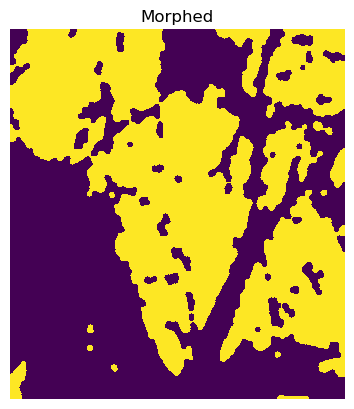

Morphology Error:  0.11155883813711809


In [8]:
# C

# creating different disk sizes
disk_1 = skimage.morphology.disk(1)
disk_5 = skimage.morphology.disk(5)
disk_10 = skimage.morphology.disk(10)
size = 500

# morphology functions
adeno_1 = skimage.morphology.closing(mask_thresholding, disk_1)
adeno_2 = skimage.morphology.remove_small_objects(adeno_1.astype(bool), size) # removing small artifacts in hue image
adeno_3 = skimage.morphology.remove_small_holes(adeno_2.astype(bool), size) # fills the spaces in the mask
adeno_4 = skimage.morphology.opening(adeno_3, disk_10) # removing larger artifacts
adeno_5 = skimage.morphology.closing(adeno_4, disk_10) # filling remaining holes

# plotting
plt.imshow(adeno_5, interpolation='nearest')
plt.title('Morphed')
plt.axis('off')
plt.show()

mask_morph = adeno_5

#
morph_err = error_fn(mask_morph)
print("Morphology Error: ", morph_err)

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

In [9]:
# TODO

# selecting hue channel as source
source = adeno_img_hsv[:,:,0]
threshold = 0.85
mask_region = np.zeros_like(source)

# creating a neighbourhood of all pixels
neighbourhood = []
for x in range(im_h):
    for y in range(im_w):
        neighbourhood.append((x, y))

# using a set for faster processing
neighbourhood = set(neighbourhood)

def get_neighbours(seed, neighbor_radius=10):

    # Parameters:
    # - seed value - pixel that wee need the neighbours of
    # - neighbor_radius - radius to consider

    # Returns:
    # - neighbours - list of pixel points within the given radius

    neighbours = []

    for i in range (-neighbor_radius, neighbor_radius+1):
        for j in range(-neighbor_radius, neighbor_radius+1):
            if i == 0 and j == 0:
                continue
            neighbours.append((seed[0] + i, seed[1] + j))

    return neighbours


# choosing seeds based on the hue image
new_seeds = [(700,700), (200,200), (1200,1000)]


while True:

    # assigning seeds to the new seeds
    seeds = new_seeds
    new_seeds = []
    prev_len = len(neighbourhood)
    for seed in seeds:

        # check if pixel has been examined
        if seed in neighbourhood:
            # check if pixel is below threshold
            if source[seed[0], seed[1]] < threshold:
                value = 1

                # assigning seed a value of 1 in the mask
                mask_region[seed[0], seed[1]] = value
                neighbours = get_neighbours(seed, 10)
                neighbourhood.remove(seed)
                for neighbour in neighbours:
                    if neighbour in neighbourhood:
                        mask_region[neighbour[0], neighbour[1]] = value


                # selecting new seeds a distance k away from the original seed
                k = 7
                new_seeds.append((seed[0]+k, seed[1]))
                new_seeds.append((seed[0]-k, seed[1]))
                new_seeds.append((seed[0], seed[1]+k))
                new_seeds.append((seed[0], seed[1]-k))
                new_seeds.append((seed[0]+k, seed[1]+k))
                new_seeds.append((seed[0]+k, seed[1]-k))
                new_seeds.append((seed[0]-k, seed[1]+k))
                new_seeds.append((seed[0]-k, seed[1]-k))

    if len(neighbourhood) == prev_len:
        break

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thresholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

In [10]:
# Add your comments here

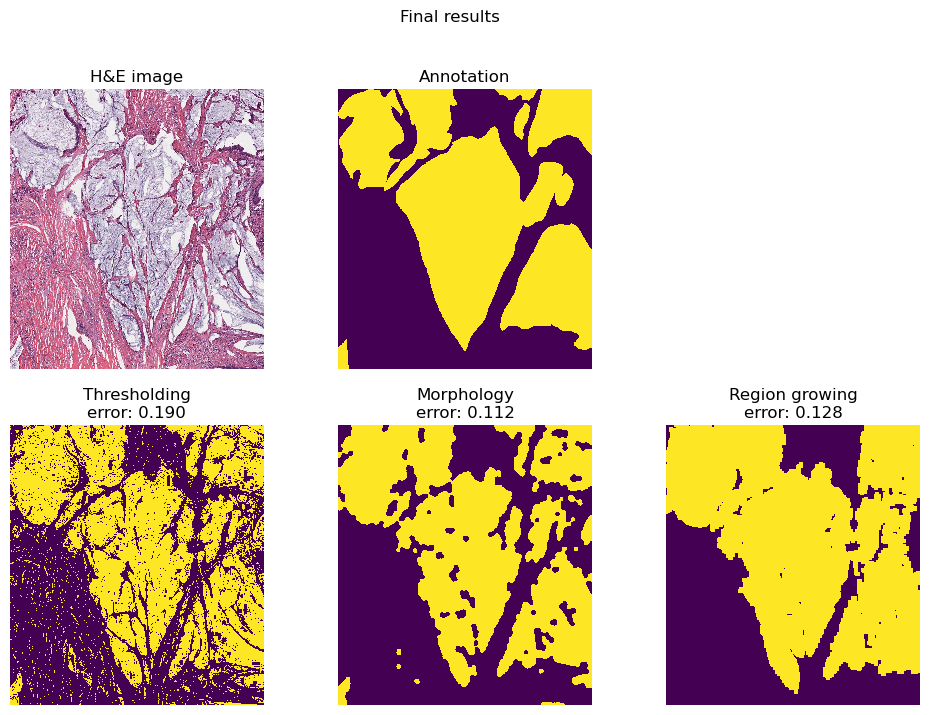

In [11]:
error_th = 1- (mask_thresholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thresholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))


# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))


[a.axis('off') for a in ax.ravel()]


plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. 
**Using this image as reference** ![image-3.png](attachment:image-3.png)

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) ![image-2.png](attachment:image-2.png)

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

In [12]:
from sklearn.mixture import GaussianMixture
import cv2
from statistics import NormalDist
import copy

def segment(input_image, plot_gaussian=True, plot_result = True, special_order=False):
    """Segments the given image as specified above by applying a trimodal GMM to the histogram
        inputs: input_image, flags if processing steps should be shown, "special_order" as flag for real-data
        returns: image, dictionary with radii distribution (keys: "inner", "outer")
    
    """
    # Convert to grayscale (all color channels carry the same information, so nothing is lost)
    img = skimage.color.rgb2gray(input_image)

    # Calculate histogram
    hist = cv2.calcHist([input_image],[0],None,[256],[0,256])
    
    # Convert to distribution (i.e. if the histogram has value x for intensity i, then generate x points at intensity i)
    X = []
    for i in range(len(hist)):
        X += [i] * int(hist[i])
    
    # Apply GMM (trimodal)
    gmm = GaussianMixture(n_components = 3)
    gmm = gmm.fit(np.array(X).reshape(-1, 1))
    means = copy.deepcopy(gmm.means_)
    covariances = copy.deepcopy(gmm.covariances_)
    sort_key = np.argsort(means, axis=0)
    means[:] = means[sort_key.reshape((3,))]
    covariances[:] = np.clip(covariances[sort_key.reshape((3,))], 1e-1, np.inf)
    models = [NormalDist(mean[0], np.sqrt(cov[0][0])) for mean, cov in zip(means.tolist(), covariances.tolist())]
    border_1, border_2 = -1, -1

    # Determine thresholds
    for i in range(256):
        if i < means[0] or i > means[2]: continue
        if border_1 == -1:
            if models[1].pdf(i) > models[0].pdf(i):
                border_1 = i
                continue
        else:
            if models[2].pdf(i) > models[1].pdf(i):
                border_2 = i
                break
    
    gmm_x = np.linspace(0,255,256)
    gmm_y = np.exp(gmm.score_samples(gmm_x.reshape(-1,1)))
    gmm_y = gmm_y * np.max(hist) / np.max(gmm_y)
    if plot_gaussian:
        fig, ax = plt.subplots()
        ax.plot(gmm_x, gmm_y, color="crimson", lw=4, label="GMM")
        ax.vlines([border_1, border_2], min(gmm_y), max(gmm_y), ["c", "m"])
        ax.set_ylabel("Frequency")
        ax.set_xlabel("Pixel Intensity")
        plt.legend()
        plt.show()
    border_1, border_2 = min([border_1, border_2]), max([border_1, border_2])
    print("Upper color border: {}\nLower color border: {}".format(border_1, border_2))
    
    # Segment image
    if not special_order:
        background = img * 255 > border_2
        inner_axon = np.logical_and(img * 255  < border_2, img * 255  > border_1)
        outer_axon = img* 255  < border_1
    else:
        inner_axon = img * 255 > border_2
        background = np.logical_and(img * 255  < border_2, img * 255  > border_1)
        outer_axon = img* 255  < border_1

    # Make sure there is no overlap of regions
    outer_axon = outer_axon ^ np.logical_and(inner_axon, outer_axon)
    background = 1 - outer_axon - inner_axon

    # Color according to given color scheme
    img_segmented = np.zeros((*img.shape,3))
    img_segmented[:,:,0] = outer_axon + background
    img_segmented[:,:,2] = inner_axon + background
    img_segmented[:,:,1] = background

    images = [1-img, img_segmented]
    im_names = ["original", "segmented"]
    
    


    segmentation_result = {
        "inner": [],
        "outer": []
    }

    # Radii calculation (find connected regions [every pixel gets region-index] -> Convert to set to iterate over those indices -> Calculate how many pixels per index -> Area-equation)
    inner_labels = skimage.measure.label(inner_axon, background=0)
    for value in list(set(inner_labels.flatten().tolist())):
        # Apply given formula and convert from pixel-radius to metric radius (division by 10)
        if value != 0: segmentation_result["inner"].append(np.sqrt(np.sum(inner_labels == value) / np.pi / 10))

    outer_labels = skimage.measure.label(inner_axon + outer_axon, background=0)
    for value in list(set(outer_labels.flatten().tolist())):
        # Apply given formula and convert from pixel-radius to metric radius (division by 10)
        if value != 0: segmentation_result["outer"].append(np.sqrt(np.sum(outer_labels == value) / np.pi / 10))

    if special_order:
        img_segmented[:,:,0] += inner_labels == 1
        img_segmented[:,:,1] += inner_labels == 1

    
    if plot_result:
        fig, axes = plt.subplots(1, 2, figsize=(24, 12))
        for ax, im, nm in zip(axes.ravel(), images, im_names):
            ax.imshow(im.astype(np.float32), cmap="binary")
            ax.axis('off')
            ax.set_title(nm)
    

    return img_segmented, segmentation_result






### 2.1 SNR

In [13]:
data_base_path

'../data'

../data


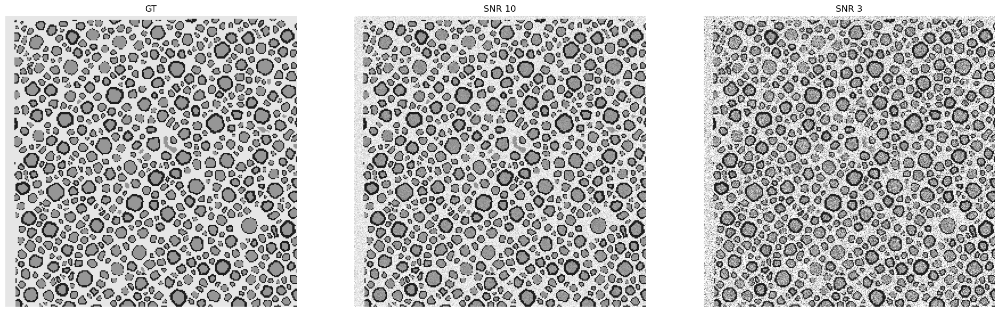

In [14]:
import cv2
import matplotlib.pyplot as plt

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv2.imread(path_folder+ files[0])
snr_10 = cv2.imread(path_folder+ files[1])
snr_3 = cv2.imread(path_folder+ files[2])

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing 

 % add your images after preprocessing


/home/svenbecker/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


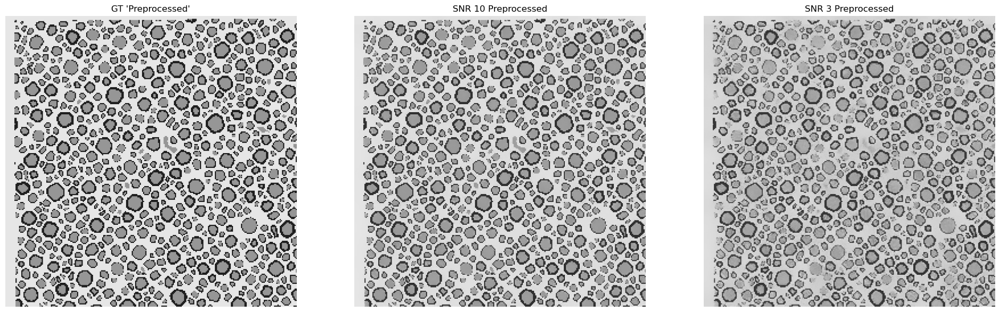

In [15]:
from skimage.filters.rank import enhance_contrast_percentile, enhance_contrast
gt_0_preproc = gt_0

snr_10_preproc = cv2.fastNlMeansDenoising(snr_10, h=20)
snr_10_preproc = cv2.GaussianBlur(snr_10_preproc,(3,3),0.6)
snr_10_preproc = cv2.bilateralFilter(snr_10_preproc,50,100,75)
snr_10_preproc = enhance_contrast_percentile(skimage.color.rgb2gray(snr_10_preproc), skimage.morphology.disk(1))
snr_10_preproc = skimage.color.gray2rgb(snr_10_preproc)

snr_3_preproc = cv2.fastNlMeansDenoising(snr_3, h=40)
snr_3_preproc = cv2.GaussianBlur(snr_3_preproc,(3,3),0.7)
snr_3_preproc = cv2.bilateralFilter(snr_3_preproc,50,100,75)
snr_3_preproc = enhance_contrast(skimage.color.rgb2gray(snr_3_preproc), skimage.morphology.disk(1))
snr_3_preproc = skimage.color.gray2rgb(snr_3_preproc)





images = [gt_0_preproc, snr_10_preproc , snr_3_preproc]
im_names = ["GT 'Preprocessed'" , "SNR 10 Preprocessed" , "SNR 3 Preprocessed"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512], cmap="binary")
    ax.axis('off')
    ax.set_title(nm)
plt.show()


### 2.1.2 Results Segmetations

Upper color border: 138
Lower color border: 218
Upper color border: 106
Lower color border: 199
Upper color border: 115
Lower color border: 198


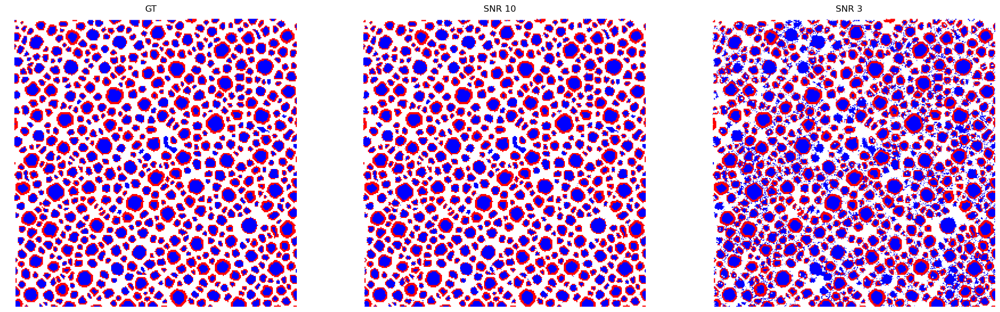

In [16]:

segmented_images = []
segmented_radii = []

for image in images:
    res1, res2 = segment(image, False, False)
    segmented_images.append(res1)
    segmented_radii.append(res2)


images = segmented_images

im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.3 Radii histrograms 

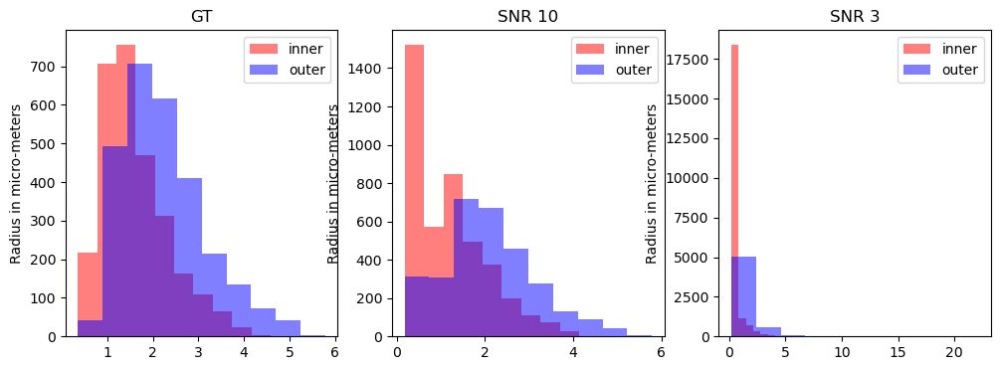

In [17]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ segmented_radii[0]["inner"] ,segmented_radii[0]["outer"]]
rads_test0 = [ segmented_radii[1]["inner"] ,segmented_radii[1]["outer"]]
rads_test1 = [ segmented_radii[2]["inner"] ,segmented_radii[2]["outer"]]

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
    ax.set_ylabel("Radius in micro-meters")
plt.show()


### 2.2 Low frequencies

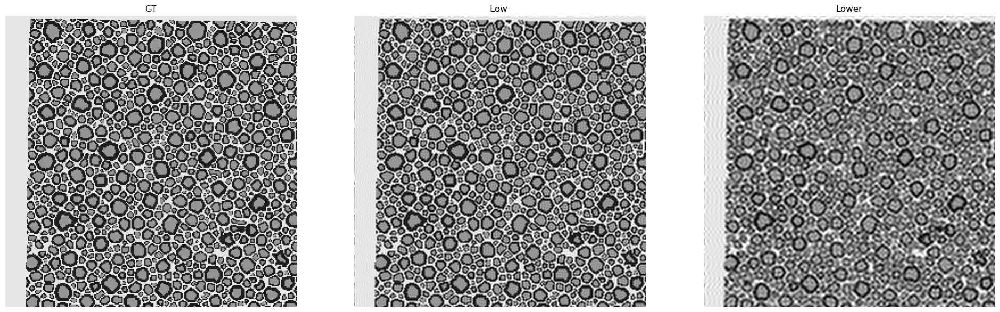

In [18]:

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder+ files[0])
lowfreq0 = cv2.imread(path_folder+ files[1])
lowfreq1 = cv2.imread(path_folder+ files[2])

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

### 2.2.2 Results Segmetations

### 2.2.3 Radii histrograms


/home/svenbecker/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


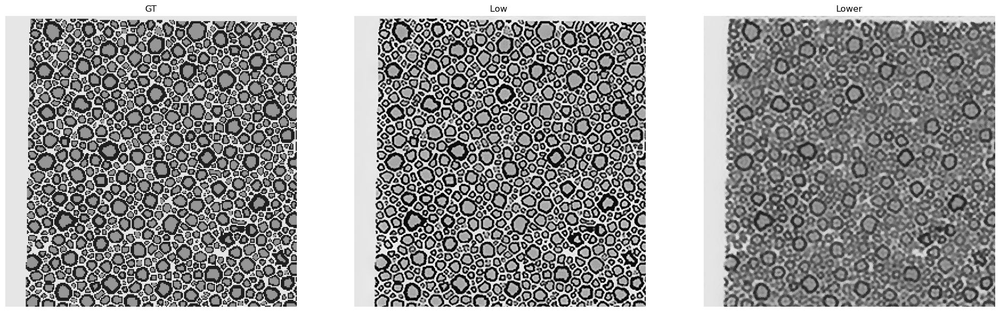

In [19]:
# Preprocessing

# Blur (get rid of Gibbs oscillations) -> Apply derivative (sharpen)    [2 times]
lowfreq0_preproc = cv2.GaussianBlur(lowfreq0,(5,5),2)
kernel = np.array([[1,-2,1], [-2,5,-2], [1,-2,1]])
lowfreq0_preproc = cv2.filter2D(lowfreq0_preproc, -1, kernel)
lowfreq0_preproc = cv2.GaussianBlur(lowfreq0_preproc,(3,3),1)
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
lowfreq0_preproc = cv2.filter2D(lowfreq0_preproc, -1, kernel)
# Enhance edges
lowfreq0_preproc = enhance_contrast_percentile(skimage.color.rgb2gray(lowfreq0_preproc), skimage.morphology.disk(1))
# Apply edge-preserving smoothing filter
lowfreq0_preproc = cv2.bilateralFilter(lowfreq0_preproc,50,50,50)
lowfreq0_preproc = skimage.color.gray2rgb(lowfreq0_preproc)


# Blur (get rid of Gibbs oscillations) -> Apply derivative (sharpen)    [2 times]
lowfreq1_preproc = cv2.GaussianBlur(lowfreq1,(7,7),3)
kernel = np.array([[1,-2,1], [-2,5,-2], [1,-2,1]])
lowfreq1_preproc = cv2.filter2D(lowfreq1_preproc, -1, kernel)
lowfreq1_preproc = cv2.GaussianBlur(lowfreq1_preproc,(3,3),1)
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
lowfreq1_preproc = cv2.filter2D(lowfreq1_preproc, -1, kernel)
# Enhance edges
lowfreq1_preproc = enhance_contrast_percentile(skimage.color.rgb2gray(lowfreq1_preproc), skimage.morphology.disk(1))
# Apply edge-preserving smoothing filter
lowfreq1_preproc = cv2.bilateralFilter(lowfreq1_preproc,50,50,50)
lowfreq1_preproc = skimage.color.gray2rgb(lowfreq1_preproc)


images = [gt_3 , lowfreq0_preproc, lowfreq1_preproc]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)

Upper color border: 138
Lower color border: 218
Upper color border: 41
Lower color border: 223
Upper color border: 113
Lower color border: 171


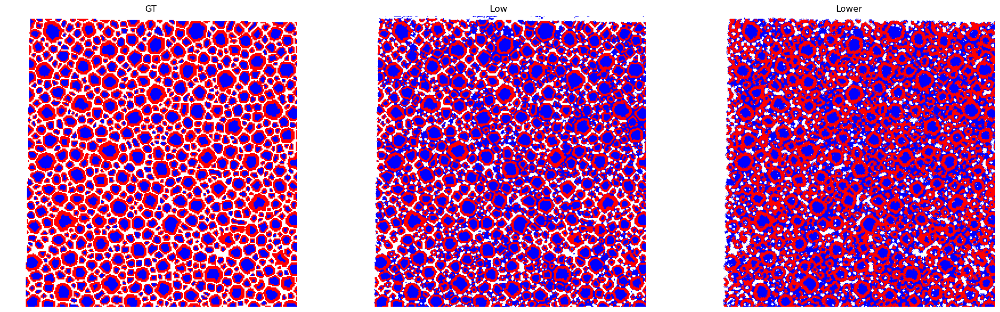

In [20]:
# Results of segmentation
segmented_images = []
segmented_radii = []

for image in images:
    res1, res2 = segment(image, False, False)
    segmented_images.append(res1)
    segmented_radii.append(res2)


images = segmented_images

im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

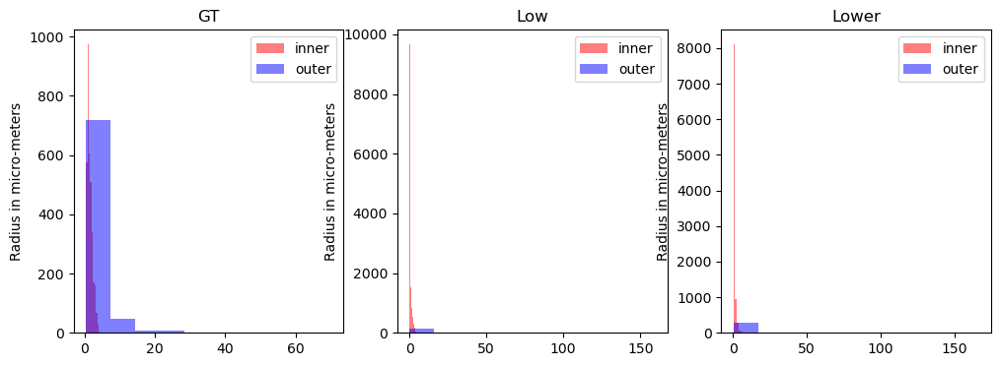

In [25]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ segmented_radii[0]["inner"] ,segmented_radii[0]["outer"]]
rads_test0 = [ segmented_radii[1]["inner"] ,segmented_radii[1]["outer"]]
rads_test1 = [ segmented_radii[2]["inner"] ,segmented_radii[2]["outer"]]

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "Low" , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
    ax.set_ylabel("Radius in micro-meters")

plt.show()

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

(-0.5, 255.5, 255.5, -0.5)

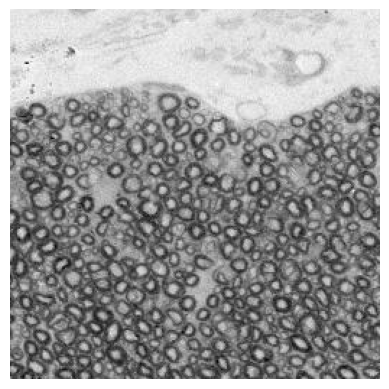

In [22]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])
plt.axis('off')

/home/svenbecker/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


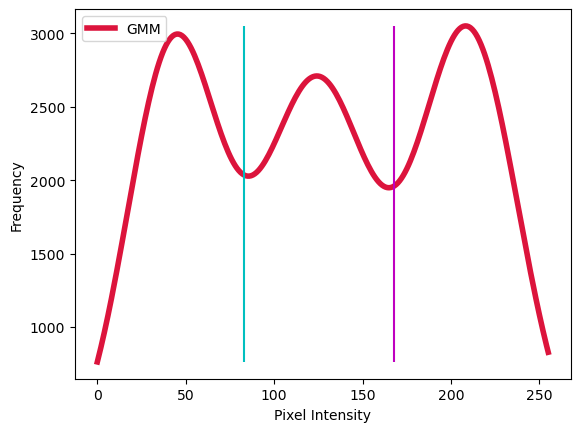

Upper color border: 83
Lower color border: 168


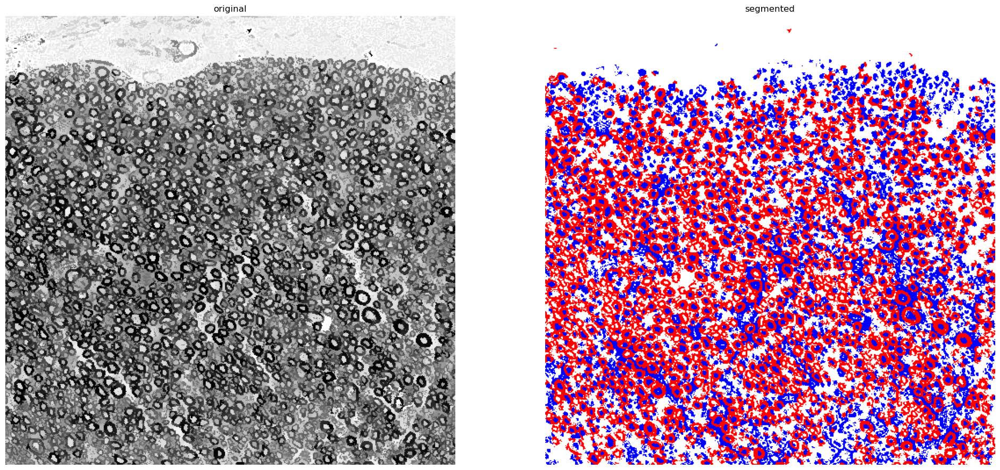

In [24]:
# Preprocessing
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
real_data_preproc = cv2.filter2D(real_data, -1, kernel)
real_data_preproc = cv2.GaussianBlur(real_data_preproc,(3,3),1)
kernel = np.array([[1,-2,1], [-2,5,-2], [1,-2,1]])
real_data_preproc = cv2.filter2D(real_data_preproc, -1, kernel)
real_data_preproc = cv2.bilateralFilter(real_data_preproc,50,50,50)

real_data_preproc = real_data[real_data.shape[0] // 10:,:,:]
real_data_preproc = enhance_contrast_percentile(skimage.color.rgb2gray(real_data), skimage.morphology.disk(3))
real_data_preproc = cv2.bilateralFilter(real_data_preproc,50,5,50)
real_data_preproc = cv2.equalizeHist(real_data_preproc )
real_data_preproc = skimage.color.gray2rgb(real_data_preproc)

res = segment(real_data_preproc, special_order=True)

# plt.imshow(real_data_preproc)
# plt.axis('off')

# Comments
## What worked / did not work

For the preprocessing against rician noise, also a median-filter worked quite well. However, the result was blurry compared to the current pipeline. 
For the preprocessing against low-pass filtering, classical high pass filters where implemented. The matrices are supposed to sharpen an image. We found that instead of just applying one sharpening step to the image, the results are better when the image is sharpened multiple times with different sharpening matrices and a blurring in between. Since the Gibbs phenomenom is visible due to sharp edges and low-pass filtering, a gaussian smoothing filtering is applied before the sharpening.

Bilateral filtering was used in all cases as it is a well-known edge-preserving filtering technique. This method is predestined for this application since we want to smooth the area withing the axon and myelin while preserving the borders of the components.

The segmentation of the noisy images always contained a small blue edge around the outer axons (as can be seen in the "lower" low pass segmentation result). This effect was firstly tackled by performing morphological operations in the segmentation algorithm itself (since those edges are small, they can be easily removed by a small structuring element). This was caused by the gradient between outer axon and myelin beeing not steep enough and thus creating intermediate values that are falsely classified. As the morphological operations in the segmentation altered the image too much, further research found that using the contrast-enhancement tool of of the `skimage` library mitigated this gradient problem such that no morphology is in the segmentation algorithm anymore.

Since the proposed segmentation algorithm based on color-space GMM worked very well for all ground-truth images, other approaches where not considered. We were sceptical in the beginning if the GMM would identify the 3 dominant distributions in all cases but were surprised by the accuracy.

The segmentation algorithm worked also well on the SNR 10 and "low" low pass images (for the SNR 10 case, the radii distributions are relatively similar to the ground-truth one). For SNR 3, rician noise was also visible in the segmentation result indicating that the preprocessing did not filter out everything. 
In the difficult real-data segmentation, our algorithm (with some modifications) worked also considerably well considering the quality of the input data. But since the inner-axon and myelin have intersecting color-spaces, their differentiation is not ideal. However, the Outer-axon identification works remarkably well.

## Future Improvements
For the preprocessing of the low-pass filtered image, one could consider calibrating the camera system with an impulse-input. The impulse-response of this can be used to identify the degradation filter ($h_D$ in lecture 1). The inverse of this filter can be used to reconstruct the original image.

For both preprocessing methods, a deep-learning approach based on Autoencoders or U-Nets can also be useful. It is especially interesting as it can be proven that training is not affected by degredated training data (i.e. one must not have ground-truth available). The EPFL lecture "Deep Learning" had one session dedicated to this: https://fleuret.org/dlc/materials/dlc-slides-7-3-denoising-autoencoders.pdf.

For the segmentation algorithm, one could use an alternative approach based on the shape of the axons. We know that there is in general a darker outer ring for each axon. We could apply a gradient filter (e.g. LoG) and search for closed objects in the results. However, this shape cannot be observed if the resolution is too little (since the outer ring is not visible). Furthermore, this algorithm is very prone to noise.
Big improvements can be expected if a deep-learning segmentation approach is used instead. This approach could attribute each pixel labels for "myelin", "inner axon", "outer axon" that can then be used in further processing techniques (like radii computation). This also has the advantage that this network could consider shape and color of the object as well as having some internal filters that mitigate detoriated input data.

Lastly, the image acquisition system could be improved.
